In [5]:
%%capture
!pip install monai
!pip install nibabel

In [9]:
import nibabel as nib
import numpy as np
import torch
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Kullanılan cihaz: {device}")

# NIfTI dosyasını yükle
nii_img = nib.load("/content/drive/MyDrive/nifti_data/subject_multi_channel_4d_FIXED.nii")
data = nii_img.get_fdata()

print("Orijinal veri shape:", data.shape)


Kullanılan cihaz: cuda
Orijinal veri shape: (160, 160, 500, 4)


In [19]:
import os
import torch
import numpy as np
from monai.data import CacheDataset, DataLoader
from monai.transforms import (
    Compose,
    LoadImaged,
    EnsureChannelFirstd,
    ScaleIntensityRanged,
    RandSpatialCropd,
    SpatialPadd,
    EnsureTyped,
    MapTransform
)

# --------------------------------------------------
# DEVICE
# --------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Kullanılan cihaz: {device}")

# --------------------------------------------------
# PARAMETRELER
# --------------------------------------------------
PATCH_SIZE_HR = 64
DS_FACTOR = 4


IMG_KEY = "img"

HR_KEY = "hr_img"
LR_KEY = "lr_img"

# --------------------------------------------------
# HR / LR OLUŞTURAN CUSTOM TRANSFORM
# --------------------------------------------------
class CreateHRLR(MapTransform):
    """
    HR görüntüden downsample edilerek LR üretir
    """
    def __init__(self, keys, ds_factor=4):
        super().__init__(keys)
        self.ds_factor = ds_factor

    def __call__(self, data):
        d = dict(data)

        for key in self.keys:
            hr = d[key]

            if not isinstance(hr, torch.Tensor):
                hr = torch.tensor(hr, dtype=torch.float32)

            # LR oluştur
            lr = torch.nn.functional.interpolate(
                hr.unsqueeze(0),          # (1, C, H, W, D)
                scale_factor=1/self.ds_factor,
                mode="trilinear",
                align_corners=False
            ).squeeze(0)

            d[HR_KEY] = hr
            d[LR_KEY] = lr

        return d

# --------------------------------------------------
# DATASET (ÖRNEK TEK NIFTI)
# --------------------------------------------------
data_dicts = [
    {
        IMG_KEY: "/content/drive/MyDrive/nifti_data/subject_001_qalas_4d.nii"
    }
]

# --------------------------------------------------
# TRANSFORM PIPELINE
# --------------------------------------------------
train_transforms = Compose([

    # 1️⃣ NIfTI yükle
    LoadImaged(keys=[IMG_KEY]),

    # 2️⃣ Kanalı başa al (C, H, W, D)
    EnsureChannelFirstd(keys=[IMG_KEY]),

    # 3️⃣ Intensite normalizasyonu
    ScaleIntensityRanged(
        keys=[IMG_KEY],
        a_min=0.0, a_max=255.0,
        b_min=0.0, b_max=1.0,
        clip=True
    ),

    # 4️⃣ Küçük görüntüler için padding
    SpatialPadd(
        keys=[IMG_KEY],
        spatial_size=[PATCH_SIZE_HR]*3,
        method="symmetric"
    ),

    # 5️⃣ Random 3D patch crop
    RandSpatialCropd(
        keys=[IMG_KEY],
        roi_size=[PATCH_SIZE_HR]*3,
        random_size=False
    ),

    # 6️⃣ HR → LR oluştur
    CreateHRLR(
        keys=[IMG_KEY],
        ds_factor=DS_FACTOR
    ),

    # 7️⃣ Torch Tensor garantisi
    EnsureTyped(keys=[HR_KEY, LR_KEY])
])

# --------------------------------------------------
# DATASET & DATALOADER
# --------------------------------------------------
train_ds = CacheDataset(
    data=data_dicts,
    transform=train_transforms,
    cache_rate=1.0,
    num_workers=2
)

train_loader = DataLoader(
    train_ds,
    batch_size=1,
    shuffle=True,
    num_workers=2
)

print(f"Dataset hazır. Örnek sayısı: {len(train_ds)}")

# --------------------------------------------------
# KONTROL
# --------------------------------------------------
for batch in train_loader:
    lr = batch[LR_KEY].to(device)
    hr = batch[HR_KEY].to(device)

    print("\n--- BATCH KONTROL ---")
    print("LR Shape:", lr.shape)
    print("HR Shape:", hr.shape)
    break


Kullanılan cihaz: cuda


Loading dataset: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

Dataset hazır. Örnek sayısı: 1



--- BATCH KONTROL ---
LR Shape: torch.Size([1, 5, 16, 16, 16])
HR Shape: torch.Size([1, 5, 64, 64, 64])


In [14]:
import torch.nn as nn
from monai.networks.nets import UNet

class ResidualUNetGenerator(nn.Module):
    def __init__(self, in_channels, out_channels, scale_factor):
        super().__init__()

        self.unet = UNet(
            spatial_dims=3,
            in_channels=in_channels,
            out_channels=64,
            channels=(32, 64, 128, 256),
            strides=(2, 2, 2),
            num_res_units=2
        )

        self.upsample = nn.ConvTranspose3d(
            in_channels=64,
            out_channels=out_channels,
            kernel_size=scale_factor,
            stride=scale_factor
        )

        self.refine = nn.Sequential(
            nn.Conv3d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, 3, padding=1)
        )

    def forward(self, x):
        feat = self.unet(x)
        sr = self.upsample(feat)
        sr = self.refine(sr)
        return sr


In [15]:
class Discriminator(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv3d(in_channels, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv3d(64, 128, 4, 2, 1),
            nn.BatchNorm3d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv3d(128, 256, 4, 2, 1),
            nn.BatchNorm3d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv3d(256, 512, 4, 2, 1),
            nn.BatchNorm3d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Çıkış: gerçek / sahte skoru
            nn.Conv3d(512, 1, 4, 1, 0)
        )

    def forward(self, x):
        return self.net(x)


In [23]:
class FeatureExtractor(nn.Module):
    def __init__(self, discriminator, feature_layer_idx=9):
        super().__init__()

        # Discriminator'ın ilk X katmanını al
        self.feature_extractor = nn.Sequential(
            *list(discriminator.net.children())[:feature_layer_idx]
        )

    def forward(self, x):
        return self.feature_extractor(x)

IN_CHANNELS  = 5
OUT_CHANNELS = 5
SCALE_FACTOR = 4


#modeller tanımlandı
generator = ResidualUNetGenerator(IN_CHANNELS, OUT_CHANNELS, SCALE_FACTOR).to(device)
discriminator = Discriminator(OUT_CHANNELS).to(device)


# Loss ve Optimizasyonlar
criterion_pixel = nn.L1Loss() # Piksel Loss (L1)
criterion_gan = nn.BCEWithLogitsLoss() # Adversarial Loss (Binary Cross Entropy)
feature_extractor = FeatureExtractor(discriminator, 9).to(device) # Örn: 9. katmana kadar kullan
criterion_feature = nn.L1Loss() # Feature Loss (Perceptual Loss)

optimizer_G = torch.optim.Adam(generator.parameters(), lr=5e-5)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=5e-5)


In [24]:
from tqdm.notebook import tqdm

# -----------------------------
# Loss ağırlıkları (denge çok önemli)
# -----------------------------
lambda_pixel = 10.0
lambda_perceptual = 0.01
lambda_adversarial = 0.001
lambda_parametric = 1.0

# Discriminator / Generator oranı
D_STEPS = 2
num_epochs = 500  # test için 500, sonra 2000+

# Nicel kanal indeksleri (QALAS varsayımı)
T1_CHANNEL_IDX = 0
T2_CHANNEL_IDX = 1

g_loss_history = []
d_loss_history = []

print(f"SRGAN eğitimi başlıyor → Epoch: {num_epochs}, D/G oranı: 1/{D_STEPS}")

for epoch in range(num_epochs):
    generator.train()
    discriminator.train()

    epoch_g_loss = 0.0
    epoch_d_loss = 0.0

    for i, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
        hr = batch[HR_KEY].to(device)   # (B, 5, 64, 64, 64)
        lr = batch[LR_KEY].to(device)   # (B, 5, 16, 16, 16)


SRGAN eğitimi başlıyor → Epoch: 500, D/G oranı: 1/2


Epoch 1/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 9/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 11/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 12/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 13/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 14/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 15/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 16/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 17/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 18/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 19/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 20/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 21/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 22/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 23/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 24/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 25/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 26/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 27/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 28/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 29/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 30/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 31/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 32/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 33/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 34/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 35/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 36/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 37/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 38/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 39/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 40/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 41/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 42/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 43/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 44/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 45/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 46/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 47/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 48/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 49/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 50/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 51/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 52/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 53/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 54/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 55/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 56/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 57/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 58/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 59/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 60/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 61/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 62/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 63/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 64/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 65/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 66/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 67/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 68/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 69/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 70/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 71/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 72/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 73/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 74/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 75/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 76/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 77/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 78/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 79/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 80/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 81/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 82/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 83/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 84/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 85/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 86/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 87/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 88/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 89/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 90/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 91/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 92/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 93/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 94/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 95/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 96/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 97/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 98/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 99/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 100/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 101/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 102/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 103/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 104/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 105/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 106/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 107/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 108/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 109/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 110/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 111/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 112/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 113/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 114/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 115/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 116/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 117/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 118/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 119/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 120/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 121/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 122/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 123/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 124/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 125/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 126/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 127/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 128/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 129/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 130/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 131/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 132/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 133/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 134/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 135/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 136/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 137/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 138/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 139/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 140/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 141/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 142/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 143/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 144/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 145/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 146/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 147/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 148/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 149/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 150/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 151/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 152/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 153/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 154/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 155/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 156/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 157/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 158/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 159/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 160/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 161/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 162/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 163/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 164/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 165/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 166/500:   0%|          | 0/1 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c1e5421cfe0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errn

Epoch 167/500:   0%|          | 0/1 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c1e5421cfe0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errn

Epoch 168/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 169/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 170/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 171/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 172/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 173/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 174/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 175/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 176/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 177/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 178/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 179/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 180/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 181/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 182/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 183/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 184/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 185/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 186/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 187/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 188/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 189/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 190/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 191/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 192/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 193/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 194/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 195/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 196/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 197/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 198/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 199/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 200/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 201/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 202/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 203/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 204/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 205/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 206/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 207/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 208/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 209/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 210/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 211/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 212/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 213/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 214/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 215/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 216/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 217/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 218/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 219/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 220/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 221/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 222/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 223/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 224/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 225/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 226/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 227/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 228/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 229/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 230/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 231/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 232/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 233/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 234/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 235/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 236/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 237/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 238/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 239/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 240/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 241/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 242/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 243/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 244/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 245/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 246/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 247/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 248/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 249/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 250/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 251/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 252/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 253/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 254/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 255/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 256/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 257/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 258/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 259/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 260/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 261/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 262/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 263/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 264/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 265/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 266/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 267/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 268/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 269/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 270/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 271/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 272/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 273/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 274/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 275/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 276/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 277/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 278/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 279/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 280/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 281/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 282/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 283/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 284/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 285/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 286/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 287/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 288/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 289/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 290/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 291/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 292/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 293/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 294/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 295/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 296/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 297/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 298/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 299/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 300/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 301/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 302/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 303/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 304/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 305/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 306/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 307/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 308/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 309/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 310/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 311/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 312/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 313/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 314/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 315/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 316/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 317/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 318/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 319/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 320/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 321/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 322/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 323/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 324/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 325/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 326/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 327/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 328/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 329/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 330/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 331/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 332/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 333/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 334/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 335/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 336/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 337/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 338/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 339/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 340/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 341/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 342/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 343/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 344/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 345/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 346/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 347/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 348/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 349/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 350/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 351/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 352/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 353/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 354/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 355/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 356/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 357/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 358/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 359/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 360/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 361/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 362/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 363/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 364/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 365/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 366/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 367/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 368/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 369/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 370/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 371/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 372/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 373/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 374/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 375/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 376/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 377/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 378/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 379/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 380/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 381/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 382/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 383/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 384/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 385/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 386/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 387/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 388/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 389/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 390/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 391/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 392/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 393/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 394/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 395/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 396/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 397/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 398/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 399/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 400/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 401/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 402/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 403/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 404/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 405/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 406/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 407/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 408/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 409/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 410/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 411/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 412/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 413/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 414/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 415/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 416/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 417/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 418/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 419/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 420/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 421/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 422/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 423/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 424/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 425/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 426/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 427/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 428/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 429/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 430/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 431/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 432/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 433/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 434/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 435/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 436/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 437/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 438/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 439/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 440/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 441/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 442/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 443/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 444/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 445/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 446/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 447/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 448/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 449/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 450/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 451/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 452/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 453/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 454/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 455/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 456/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 457/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 458/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 459/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 460/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 461/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 462/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 463/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 464/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 465/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 466/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 467/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 468/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 469/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 470/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 471/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 472/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 473/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 474/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 475/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 476/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 477/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 478/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 479/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 480/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 481/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 482/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 483/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 484/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 485/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 486/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 487/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 488/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 489/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 490/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 491/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 492/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 493/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 494/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 495/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 496/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 497/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 498/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 499/500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 500/500:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 42.6 MB/s eta 0:00:00


In [27]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure


def visualize_hybrid_output(
    generator,
    dataloader,
    device,
    hr_key,
    lr_key,
    channel_idx=0
):
    """
    3D Hybrid SRGAN çıktısını görselleştirir.
    Varsayım:
    - Tensor shape: (B, C, H, W, D)
    - Kanal sayısı: >= 1 (ör. 5)
    """

    generator.eval()

    try:
        batch = next(iter(dataloader))
    except StopIteration:
        print("❌ DataLoader boş")
        return

    lr = batch[lr_key].to(device)   # (B, C, h, w, d)
    hr = batch[hr_key].to(device)   # (B, C, H, W, D)

    with torch.no_grad():
        sr = generator(lr)
        bicubic = F.interpolate(
            lr,
            size=hr.shape[2:],
            mode="trilinear",
            align_corners=False
        )

    # CPU
    sr = sr.cpu().float()
    hr = hr.cpu().float()
    bicubic = bicubic.cpu().float()

    # -------------------------
    # METRİKLER (TÜM KANALLAR)
    # -------------------------
    psnr = PeakSignalNoiseRatio(data_range=1.0)
    ssim = StructuralSimilarityIndexMeasure(data_range=1.0)

    model_psnr = psnr(sr, hr).item()
    model_ssim = ssim(sr, hr).item()

    bic_psnr = psnr(bicubic, hr).item()
    bic_ssim = ssim(bicubic, hr).item()

    print("\n📊 METRİK SONUÇLARI (Tüm Kanallar)")
    print(f"SRGAN   → PSNR: {model_psnr:.3f} | SSIM: {model_ssim:.4f}")
    print(f"Bicubic → PSNR: {bic_psnr:.3f} | SSIM: {bic_ssim:.4f}")
    print("-" * 45)

    # -------------------------
    # ORTA DİLİM (D ekseni)
    # -------------------------
    d_hr = hr.shape[-1] // 2
    d_lr = lr.shape[-1] // 2

    hr_slice = hr[0, channel_idx, :, :, d_hr].numpy()
    sr_slice = sr[0, channel_idx, :, :, d_hr].numpy()
    bic_slice = bicubic[0, channel_idx, :, :, d_hr].numpy()
    lr_slice = lr.cpu()[0, channel_idx, :, :, d_lr].numpy()

    # -------------------------
    # HATA HARİTASI
    # -------------------------
    error_map = np.abs(sr_slice - hr_slice)

    # -------------------------
    # GÖRSELLEŞTİRME
    # -------------------------
    fig, ax = plt.subplots(1, 5, figsize=(26, 5))
    fig.suptitle(
        f"Hybrid SRGAN Analizi | Kanal {channel_idx} | Dilim {d_hr}",
        fontsize=16
    )

    ax[0].imshow(lr_slice, cmap="gray")
    ax[0].set_title("1️⃣ LR Input")
    ax[0].axis("off")

    ax[1].imshow(bic_slice, cmap="gray")
    ax[1].set_title(f"2️⃣ Bicubic\nPSNR: {bic_psnr:.2f}")
    ax[1].axis("off")

    ax[2].imshow(sr_slice, cmap="gray")
    ax[2].set_title(f"3️⃣ Hybrid SRGAN\nPSNR: {model_psnr:.2f}")
    ax[2].axis("off")

    ax[3].imshow(hr_slice, cmap="gray")
    ax[3].set_title("4️⃣ HR Ground Truth")
    ax[3].axis("off")

    im = ax[4].imshow(error_map, cmap="jet")
    ax[4].set_title("5️⃣ Hata Haritası | |SR − HR|", color="red")
    ax[4].axis("off")

    fig.colorbar(im, ax=ax[4], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

    # -------------------------
    # NOKTASAL DEĞER ANALİZİ
    # -------------------------
    H, W = hr_slice.shape
    cy, cx = H // 2, W // 2

    print("📍 Merkez Piksel Karşılaştırması")
    print(f"HR      : {hr_slice[cy, cx]:.4f}")
    print(f"SRGAN   : {sr_slice[cy, cx]:.4f}")
    print(f"Bicubic : {bic_slice[cy, cx]:.4f}")



📊 METRİK SONUÇLARI (Tüm Kanallar)
SRGAN   → PSNR: 7.445 | SSIM: -0.0512
Bicubic → PSNR: 18.987 | SSIM: 0.5600
---------------------------------------------


/tmp/ipython-input-1633943651.py:112: UserWarning: Glyph 8419 (\N{COMBINING ENCLOSING KEYCAP}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8419 (\N{COMBINING ENCLOSING KEYCAP}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


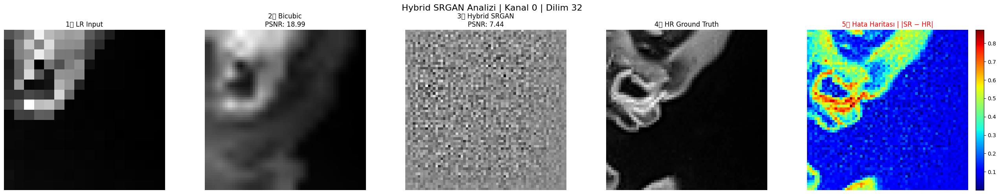

📍 Merkez Piksel Karşılaştırması
HR      : 0.0157
SRGAN   : -0.0558
Bicubic : 0.0932


In [30]:
visualize_hybrid_output(
    generator=generator,
    dataloader=train_loader,
    device=device,
    hr_key=HR_KEY,
    lr_key=LR_KEY,
    channel_idx=0   # T1 için (T2 görmek istersen 1 yap)
)


Epoch 2493/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2493 Bitti. Ort. G Loss: 0.2365


Epoch 2494/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2494 Bitti. Ort. G Loss: 0.3596


Epoch 2495/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2495 Bitti. Ort. G Loss: 0.5010


Epoch 2496/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2496 Bitti. Ort. G Loss: 0.4900


Epoch 2497/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2497 Bitti. Ort. G Loss: 0.3679


Epoch 2498/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2498 Bitti. Ort. G Loss: 0.4736


Epoch 2499/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2499 Bitti. Ort. G Loss: 0.3476


Epoch 2500/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2500 Bitti. Ort. G Loss: 0.4619

📊 METRİK SONUÇLARI (Tüm Kanallar)
SRGAN   → PSNR: 16.596 | SSIM: 0.4141
Bicubic → PSNR: 17.709 | SSIM: 0.4920
---------------------------------------------


/tmp/ipython-input-1633943651.py:112: UserWarning: Glyph 8419 (\N{COMBINING ENCLOSING KEYCAP}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8419 (\N{COMBINING ENCLOSING KEYCAP}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


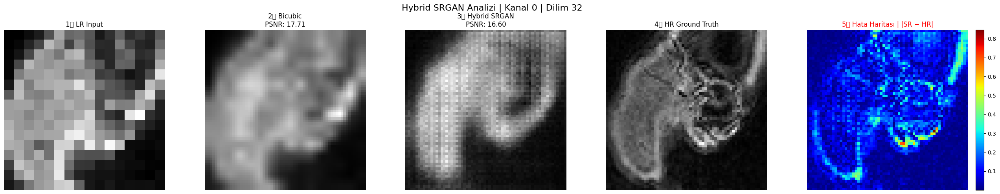

📍 Merkez Piksel Karşılaştırması
HR      : 0.4275
SRGAN   : 0.3996
Bicubic : 0.2972


Loading dataset: 100%|██████████| 1/1 [00:00<00:00,  6.73it/s]


Eğitim Başlıyor...


Epoch 1/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1 Bitti. Ort. G Loss: 1.7941


Epoch 2/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 2 Bitti. Ort. G Loss: 0.8199


Epoch 3/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 3 Bitti. Ort. G Loss: 1.7348


Epoch 4/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 4 Bitti. Ort. G Loss: 1.1876


Epoch 5/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 5 Bitti. Ort. G Loss: 1.8766


Epoch 6/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 6 Bitti. Ort. G Loss: 1.3892


Epoch 7/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 7 Bitti. Ort. G Loss: 1.5380


Epoch 8/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 8 Bitti. Ort. G Loss: 1.3223


Epoch 9/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 9 Bitti. Ort. G Loss: 1.7452


Epoch 10/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 10 Bitti. Ort. G Loss: 0.5767


Epoch 11/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 11 Bitti. Ort. G Loss: 1.7569


Epoch 12/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 12 Bitti. Ort. G Loss: 1.4877


Epoch 13/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 13 Bitti. Ort. G Loss: 1.4266


Epoch 14/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 14 Bitti. Ort. G Loss: 1.2451


Epoch 15/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 15 Bitti. Ort. G Loss: 1.8326


Epoch 16/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 16 Bitti. Ort. G Loss: 1.6385


Epoch 17/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 17 Bitti. Ort. G Loss: 1.2435


Epoch 18/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 18 Bitti. Ort. G Loss: 1.6547


Epoch 19/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 19 Bitti. Ort. G Loss: 1.4948


Epoch 20/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 20 Bitti. Ort. G Loss: 1.4080


Epoch 21/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 21 Bitti. Ort. G Loss: 1.8335


Epoch 22/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 22 Bitti. Ort. G Loss: 1.4943


Epoch 23/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 23 Bitti. Ort. G Loss: 1.0235


Epoch 24/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 24 Bitti. Ort. G Loss: 1.3818


Epoch 25/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 25 Bitti. Ort. G Loss: 1.0632


Epoch 26/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 26 Bitti. Ort. G Loss: 0.7728


Epoch 27/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 27 Bitti. Ort. G Loss: 1.4284


Epoch 28/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 28 Bitti. Ort. G Loss: 1.1886


Epoch 29/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 29 Bitti. Ort. G Loss: 0.7995


Epoch 30/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 30 Bitti. Ort. G Loss: 0.8400


Epoch 31/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 31 Bitti. Ort. G Loss: 0.7026


Epoch 32/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 32 Bitti. Ort. G Loss: 1.1368


Epoch 33/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 33 Bitti. Ort. G Loss: 0.9401


Epoch 34/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 34 Bitti. Ort. G Loss: 0.8904


Epoch 35/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 35 Bitti. Ort. G Loss: 0.8007


Epoch 36/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 36 Bitti. Ort. G Loss: 1.1946


Epoch 37/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 37 Bitti. Ort. G Loss: 0.7966


Epoch 38/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 38 Bitti. Ort. G Loss: 1.0167


Epoch 39/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 39 Bitti. Ort. G Loss: 1.0522


Epoch 40/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 40 Bitti. Ort. G Loss: 1.2845


Epoch 41/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 41 Bitti. Ort. G Loss: 1.1279


Epoch 42/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 42 Bitti. Ort. G Loss: 0.9586


Epoch 43/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 43 Bitti. Ort. G Loss: 1.3237


Epoch 44/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 44 Bitti. Ort. G Loss: 1.1000


Epoch 45/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 45 Bitti. Ort. G Loss: 1.0027


Epoch 46/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 46 Bitti. Ort. G Loss: 1.0791


Epoch 47/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 47 Bitti. Ort. G Loss: 0.9753


Epoch 48/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 48 Bitti. Ort. G Loss: 1.0451


Epoch 49/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 49 Bitti. Ort. G Loss: 1.0962


Epoch 50/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 50 Bitti. Ort. G Loss: 0.9435


Epoch 51/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 51 Bitti. Ort. G Loss: 1.0286


Epoch 52/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 52 Bitti. Ort. G Loss: 0.9403


Epoch 53/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 53 Bitti. Ort. G Loss: 0.8232


Epoch 54/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 54 Bitti. Ort. G Loss: 0.9548


Epoch 55/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 55 Bitti. Ort. G Loss: 0.9008


Epoch 56/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 56 Bitti. Ort. G Loss: 0.7550


Epoch 57/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 57 Bitti. Ort. G Loss: 0.7793


Epoch 58/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 58 Bitti. Ort. G Loss: 0.8424


Epoch 59/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 59 Bitti. Ort. G Loss: 0.6604


Epoch 60/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 60 Bitti. Ort. G Loss: 0.6958


Epoch 61/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 61 Bitti. Ort. G Loss: 1.2165


Epoch 62/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 62 Bitti. Ort. G Loss: 1.0102


Epoch 63/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 63 Bitti. Ort. G Loss: 1.1586


Epoch 64/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 64 Bitti. Ort. G Loss: 0.9552


Epoch 65/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 65 Bitti. Ort. G Loss: 0.7265


Epoch 66/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 66 Bitti. Ort. G Loss: 1.2477


Epoch 67/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 67 Bitti. Ort. G Loss: 0.7808


Epoch 68/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 68 Bitti. Ort. G Loss: 1.0961


Epoch 69/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 69 Bitti. Ort. G Loss: 0.9142


Epoch 70/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 70 Bitti. Ort. G Loss: 0.7864


Epoch 71/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 71 Bitti. Ort. G Loss: 1.0338


Epoch 72/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 72 Bitti. Ort. G Loss: 1.1969


Epoch 73/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 73 Bitti. Ort. G Loss: 0.7752


Epoch 74/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 74 Bitti. Ort. G Loss: 0.9290


Epoch 75/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 75 Bitti. Ort. G Loss: 0.7782


Epoch 76/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 76 Bitti. Ort. G Loss: 0.7832


Epoch 77/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 77 Bitti. Ort. G Loss: 0.8006


Epoch 78/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 78 Bitti. Ort. G Loss: 0.6808


Epoch 79/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 79 Bitti. Ort. G Loss: 0.9172


Epoch 80/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 80 Bitti. Ort. G Loss: 0.8367


Epoch 81/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 81 Bitti. Ort. G Loss: 0.7920


Epoch 82/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 82 Bitti. Ort. G Loss: 0.7259


Epoch 83/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 83 Bitti. Ort. G Loss: 0.7526


Epoch 84/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 84 Bitti. Ort. G Loss: 1.0161


Epoch 85/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 85 Bitti. Ort. G Loss: 0.6722


Epoch 86/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 86 Bitti. Ort. G Loss: 0.6867


Epoch 87/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 87 Bitti. Ort. G Loss: 1.0487


Epoch 88/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 88 Bitti. Ort. G Loss: 0.6414


Epoch 89/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 89 Bitti. Ort. G Loss: 0.7373


Epoch 90/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 90 Bitti. Ort. G Loss: 0.7103


Epoch 91/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 91 Bitti. Ort. G Loss: 0.9406


Epoch 92/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 92 Bitti. Ort. G Loss: 0.7528


Epoch 93/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 93 Bitti. Ort. G Loss: 0.6589


Epoch 94/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 94 Bitti. Ort. G Loss: 0.8080


Epoch 95/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 95 Bitti. Ort. G Loss: 0.8141


Epoch 96/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 96 Bitti. Ort. G Loss: 0.8578


Epoch 97/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 97 Bitti. Ort. G Loss: 0.8433


Epoch 98/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 98 Bitti. Ort. G Loss: 0.7239


Epoch 99/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 99 Bitti. Ort. G Loss: 0.6533


Epoch 100/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 100 Bitti. Ort. G Loss: 0.6456


Epoch 101/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 101 Bitti. Ort. G Loss: 0.6363


Epoch 102/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 102 Bitti. Ort. G Loss: 0.6678


Epoch 103/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 103 Bitti. Ort. G Loss: 0.7244


Epoch 104/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 104 Bitti. Ort. G Loss: 0.9688


Epoch 105/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 105 Bitti. Ort. G Loss: 0.9000


Epoch 106/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 106 Bitti. Ort. G Loss: 0.8470


Epoch 107/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 107 Bitti. Ort. G Loss: 0.7332


Epoch 108/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 108 Bitti. Ort. G Loss: 0.8084


Epoch 109/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 109 Bitti. Ort. G Loss: 0.6414


Epoch 110/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 110 Bitti. Ort. G Loss: 0.7485


Epoch 111/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 111 Bitti. Ort. G Loss: 0.7075


Epoch 112/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 112 Bitti. Ort. G Loss: 0.9037


Epoch 113/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 113 Bitti. Ort. G Loss: 0.6344


Epoch 114/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 114 Bitti. Ort. G Loss: 0.6207


Epoch 115/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 115 Bitti. Ort. G Loss: 0.6963


Epoch 116/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 116 Bitti. Ort. G Loss: 0.7939


Epoch 117/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 117 Bitti. Ort. G Loss: 0.5944


Epoch 118/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 118 Bitti. Ort. G Loss: 0.8529


Epoch 119/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 119 Bitti. Ort. G Loss: 0.6614


Epoch 120/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 120 Bitti. Ort. G Loss: 0.9164


Epoch 121/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 121 Bitti. Ort. G Loss: 0.6344


Epoch 122/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 122 Bitti. Ort. G Loss: 0.9782


Epoch 123/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 123 Bitti. Ort. G Loss: 0.7132


Epoch 124/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 124 Bitti. Ort. G Loss: 0.6646


Epoch 125/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 125 Bitti. Ort. G Loss: 0.7995


Epoch 126/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 126 Bitti. Ort. G Loss: 0.7915


Epoch 127/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 127 Bitti. Ort. G Loss: 0.5596


Epoch 128/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 128 Bitti. Ort. G Loss: 0.5586


Epoch 129/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 129 Bitti. Ort. G Loss: 0.6129


Epoch 130/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 130 Bitti. Ort. G Loss: 0.5853


Epoch 131/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 131 Bitti. Ort. G Loss: 0.7977


Epoch 132/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 132 Bitti. Ort. G Loss: 0.7761


Epoch 133/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 133 Bitti. Ort. G Loss: 0.6334


Epoch 134/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 134 Bitti. Ort. G Loss: 0.6189


Epoch 135/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 135 Bitti. Ort. G Loss: 0.6369


Epoch 136/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 136 Bitti. Ort. G Loss: 0.4944


Epoch 137/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 137 Bitti. Ort. G Loss: 0.9510


Epoch 138/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 138 Bitti. Ort. G Loss: 0.8528


Epoch 139/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 139 Bitti. Ort. G Loss: 1.0072


Epoch 140/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 140 Bitti. Ort. G Loss: 0.7109


Epoch 141/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 141 Bitti. Ort. G Loss: 0.6405


Epoch 142/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 142 Bitti. Ort. G Loss: 0.6185


Epoch 143/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 143 Bitti. Ort. G Loss: 0.6562


Epoch 144/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 144 Bitti. Ort. G Loss: 0.7006


Epoch 145/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 145 Bitti. Ort. G Loss: 0.5914


Epoch 146/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 146 Bitti. Ort. G Loss: 0.6539


Epoch 147/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 147 Bitti. Ort. G Loss: 0.7822


Epoch 148/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 148 Bitti. Ort. G Loss: 0.6878


Epoch 149/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 149 Bitti. Ort. G Loss: 0.6455


Epoch 150/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 150 Bitti. Ort. G Loss: 0.7392


Epoch 151/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 151 Bitti. Ort. G Loss: 0.6466


Epoch 152/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 152 Bitti. Ort. G Loss: 0.8259


Epoch 153/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 153 Bitti. Ort. G Loss: 0.7649


Epoch 154/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 154 Bitti. Ort. G Loss: 0.7713


Epoch 155/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 155 Bitti. Ort. G Loss: 0.6686


Epoch 156/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 156 Bitti. Ort. G Loss: 0.7037


Epoch 157/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 157 Bitti. Ort. G Loss: 0.6507


Epoch 158/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 158 Bitti. Ort. G Loss: 0.7282


Epoch 159/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 159 Bitti. Ort. G Loss: 0.6831


Epoch 160/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 160 Bitti. Ort. G Loss: 0.9006


Epoch 161/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 161 Bitti. Ort. G Loss: 0.5969


Epoch 162/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 162 Bitti. Ort. G Loss: 0.6640


Epoch 163/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 163 Bitti. Ort. G Loss: 0.6451


Epoch 164/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 164 Bitti. Ort. G Loss: 0.6920


Epoch 165/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 165 Bitti. Ort. G Loss: 0.6267


Epoch 166/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 166 Bitti. Ort. G Loss: 0.6445


Epoch 167/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 167 Bitti. Ort. G Loss: 0.8981


Epoch 168/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 168 Bitti. Ort. G Loss: 0.8065


Epoch 169/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 169 Bitti. Ort. G Loss: 0.8224


Epoch 170/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 170 Bitti. Ort. G Loss: 0.5567


Epoch 171/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 171 Bitti. Ort. G Loss: 0.5845


Epoch 172/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 172 Bitti. Ort. G Loss: 0.7332


Epoch 173/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 173 Bitti. Ort. G Loss: 0.6769


Epoch 174/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 174 Bitti. Ort. G Loss: 0.7108


Epoch 175/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 175 Bitti. Ort. G Loss: 0.5408


Epoch 176/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 176 Bitti. Ort. G Loss: 0.6623


Epoch 177/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 177 Bitti. Ort. G Loss: 0.6537


Epoch 178/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 178 Bitti. Ort. G Loss: 0.8826


Epoch 179/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 179 Bitti. Ort. G Loss: 0.8358


Epoch 180/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 180 Bitti. Ort. G Loss: 0.5392


Epoch 181/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 181 Bitti. Ort. G Loss: 0.5030


Epoch 182/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 182 Bitti. Ort. G Loss: 0.5407


Epoch 183/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 183 Bitti. Ort. G Loss: 0.6847


Epoch 184/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 184 Bitti. Ort. G Loss: 0.6341


Epoch 185/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 185 Bitti. Ort. G Loss: 0.4660


Epoch 186/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 186 Bitti. Ort. G Loss: 0.4822


Epoch 187/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 187 Bitti. Ort. G Loss: 0.8612


Epoch 188/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 188 Bitti. Ort. G Loss: 0.5603


Epoch 189/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 189 Bitti. Ort. G Loss: 0.4878


Epoch 190/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 190 Bitti. Ort. G Loss: 0.9695


Epoch 191/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 191 Bitti. Ort. G Loss: 0.6842


Epoch 192/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 192 Bitti. Ort. G Loss: 0.4866


Epoch 193/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 193 Bitti. Ort. G Loss: 0.5778


Epoch 194/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 194 Bitti. Ort. G Loss: 0.4722


Epoch 195/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 195 Bitti. Ort. G Loss: 0.6055


Epoch 196/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 196 Bitti. Ort. G Loss: 0.5614


Epoch 197/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 197 Bitti. Ort. G Loss: 0.7033


Epoch 198/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 198 Bitti. Ort. G Loss: 0.4542


Epoch 199/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 199 Bitti. Ort. G Loss: 0.6745


Epoch 200/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 200 Bitti. Ort. G Loss: 0.8613


Epoch 201/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 201 Bitti. Ort. G Loss: 0.6040


Epoch 202/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 202 Bitti. Ort. G Loss: 0.5002


Epoch 203/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 203 Bitti. Ort. G Loss: 0.8380


Epoch 204/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 204 Bitti. Ort. G Loss: 0.8173


Epoch 205/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 205 Bitti. Ort. G Loss: 0.7227


Epoch 206/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 206 Bitti. Ort. G Loss: 0.7671


Epoch 207/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 207 Bitti. Ort. G Loss: 0.4817


Epoch 208/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 208 Bitti. Ort. G Loss: 0.6277


Epoch 209/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 209 Bitti. Ort. G Loss: 0.8417


Epoch 210/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 210 Bitti. Ort. G Loss: 0.6152


Epoch 211/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 211 Bitti. Ort. G Loss: 0.9293


Epoch 212/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 212 Bitti. Ort. G Loss: 0.6216


Epoch 213/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 213 Bitti. Ort. G Loss: 0.6911


Epoch 214/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 214 Bitti. Ort. G Loss: 0.7491


Epoch 215/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 215 Bitti. Ort. G Loss: 0.6712


Epoch 216/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 216 Bitti. Ort. G Loss: 0.6013


Epoch 217/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 217 Bitti. Ort. G Loss: 0.7922


Epoch 218/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 218 Bitti. Ort. G Loss: 0.7540


Epoch 219/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 219 Bitti. Ort. G Loss: 0.7548


Epoch 220/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 220 Bitti. Ort. G Loss: 0.5699


Epoch 221/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 221 Bitti. Ort. G Loss: 0.6273


Epoch 222/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 222 Bitti. Ort. G Loss: 0.5277


Epoch 223/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 223 Bitti. Ort. G Loss: 0.7922


Epoch 224/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 224 Bitti. Ort. G Loss: 0.7228


Epoch 225/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 225 Bitti. Ort. G Loss: 0.8115


Epoch 226/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 226 Bitti. Ort. G Loss: 0.7521


Epoch 227/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 227 Bitti. Ort. G Loss: 0.7338


Epoch 228/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 228 Bitti. Ort. G Loss: 0.7273


Epoch 229/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 229 Bitti. Ort. G Loss: 0.7842


Epoch 230/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 230 Bitti. Ort. G Loss: 0.5148


Epoch 231/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 231 Bitti. Ort. G Loss: 0.6549


Epoch 232/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 232 Bitti. Ort. G Loss: 0.8246


Epoch 233/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 233 Bitti. Ort. G Loss: 0.6483


Epoch 234/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 234 Bitti. Ort. G Loss: 0.7112


Epoch 235/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 235 Bitti. Ort. G Loss: 0.5103


Epoch 236/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 236 Bitti. Ort. G Loss: 0.6404


Epoch 237/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 237 Bitti. Ort. G Loss: 0.5242


Epoch 238/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 238 Bitti. Ort. G Loss: 0.5568


Epoch 239/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 239 Bitti. Ort. G Loss: 0.7677


Epoch 240/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 240 Bitti. Ort. G Loss: 0.5119


Epoch 241/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 241 Bitti. Ort. G Loss: 0.4241


Epoch 242/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 242 Bitti. Ort. G Loss: 0.5789


Epoch 243/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 243 Bitti. Ort. G Loss: 0.5182


Epoch 244/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 244 Bitti. Ort. G Loss: 0.7430


Epoch 245/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 245 Bitti. Ort. G Loss: 0.7776


Epoch 246/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 246 Bitti. Ort. G Loss: 0.6858


Epoch 247/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 247 Bitti. Ort. G Loss: 0.8365


Epoch 248/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 248 Bitti. Ort. G Loss: 0.5481


Epoch 249/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 249 Bitti. Ort. G Loss: 0.6089


Epoch 250/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 250 Bitti. Ort. G Loss: 0.6453


Epoch 251/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 251 Bitti. Ort. G Loss: 0.5359


Epoch 252/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 252 Bitti. Ort. G Loss: 0.7420


Epoch 253/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 253 Bitti. Ort. G Loss: 0.4979


Epoch 254/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 254 Bitti. Ort. G Loss: 0.4622


Epoch 255/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 255 Bitti. Ort. G Loss: 0.6520


Epoch 256/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 256 Bitti. Ort. G Loss: 0.4501


Epoch 257/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 257 Bitti. Ort. G Loss: 0.4946


Epoch 258/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 258 Bitti. Ort. G Loss: 0.5941


Epoch 259/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 259 Bitti. Ort. G Loss: 0.8865


Epoch 260/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 260 Bitti. Ort. G Loss: 0.5692


Epoch 261/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 261 Bitti. Ort. G Loss: 0.4389


Epoch 262/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 262 Bitti. Ort. G Loss: 0.7897


Epoch 263/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 263 Bitti. Ort. G Loss: 0.7305


Epoch 264/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 264 Bitti. Ort. G Loss: 0.6983


Epoch 265/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 265 Bitti. Ort. G Loss: 0.6022


Epoch 266/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 266 Bitti. Ort. G Loss: 0.7521


Epoch 267/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 267 Bitti. Ort. G Loss: 0.5207


Epoch 268/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 268 Bitti. Ort. G Loss: 0.7166


Epoch 269/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 269 Bitti. Ort. G Loss: 0.6714


Epoch 270/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 270 Bitti. Ort. G Loss: 0.6284


Epoch 271/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 271 Bitti. Ort. G Loss: 0.7753


Epoch 272/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 272 Bitti. Ort. G Loss: 0.5963


Epoch 273/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 273 Bitti. Ort. G Loss: 0.7589


Epoch 274/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 274 Bitti. Ort. G Loss: 0.7086


Epoch 275/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 275 Bitti. Ort. G Loss: 0.5482


Epoch 276/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 276 Bitti. Ort. G Loss: 0.5762


Epoch 277/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 277 Bitti. Ort. G Loss: 0.5982


Epoch 278/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 278 Bitti. Ort. G Loss: 0.6372


Epoch 279/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 279 Bitti. Ort. G Loss: 0.6839


Epoch 280/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 280 Bitti. Ort. G Loss: 0.5318


Epoch 281/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 281 Bitti. Ort. G Loss: 0.7153


Epoch 282/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 282 Bitti. Ort. G Loss: 0.6870


Epoch 283/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 283 Bitti. Ort. G Loss: 0.7677


Epoch 284/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 284 Bitti. Ort. G Loss: 0.7012


Epoch 285/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 285 Bitti. Ort. G Loss: 0.8386


Epoch 286/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 286 Bitti. Ort. G Loss: 0.7427


Epoch 287/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 287 Bitti. Ort. G Loss: 0.7156


Epoch 288/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 288 Bitti. Ort. G Loss: 0.7579


Epoch 289/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 289 Bitti. Ort. G Loss: 0.6268


Epoch 290/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 290 Bitti. Ort. G Loss: 0.6153


Epoch 291/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 291 Bitti. Ort. G Loss: 0.4901


Epoch 292/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 292 Bitti. Ort. G Loss: 0.5199


Epoch 293/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 293 Bitti. Ort. G Loss: 0.7636


Epoch 294/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 294 Bitti. Ort. G Loss: 0.6178


Epoch 295/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 295 Bitti. Ort. G Loss: 0.7297


Epoch 296/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 296 Bitti. Ort. G Loss: 0.7311


Epoch 297/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 297 Bitti. Ort. G Loss: 0.6819


Epoch 298/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 298 Bitti. Ort. G Loss: 0.6320


Epoch 299/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 299 Bitti. Ort. G Loss: 0.5866


Epoch 300/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 300 Bitti. Ort. G Loss: 0.7573


Epoch 301/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 301 Bitti. Ort. G Loss: 0.6074


Epoch 302/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 302 Bitti. Ort. G Loss: 0.7959


Epoch 303/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 303 Bitti. Ort. G Loss: 0.4934


Epoch 304/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 304 Bitti. Ort. G Loss: 0.6553


Epoch 305/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 305 Bitti. Ort. G Loss: 0.5693


Epoch 306/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 306 Bitti. Ort. G Loss: 0.5755


Epoch 307/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 307 Bitti. Ort. G Loss: 0.4532


Epoch 308/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 308 Bitti. Ort. G Loss: 0.6386


Epoch 309/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 309 Bitti. Ort. G Loss: 0.5802


Epoch 310/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 310 Bitti. Ort. G Loss: 0.7220


Epoch 311/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 311 Bitti. Ort. G Loss: 0.5366


Epoch 312/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 312 Bitti. Ort. G Loss: 0.4201


Epoch 313/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 313 Bitti. Ort. G Loss: 0.5885


Epoch 314/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 314 Bitti. Ort. G Loss: 0.6059


Epoch 315/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 315 Bitti. Ort. G Loss: 0.6629


Epoch 316/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 316 Bitti. Ort. G Loss: 0.7079


Epoch 317/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 317 Bitti. Ort. G Loss: 0.7347


Epoch 318/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 318 Bitti. Ort. G Loss: 0.4953


Epoch 319/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 319 Bitti. Ort. G Loss: 0.6892


Epoch 320/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 320 Bitti. Ort. G Loss: 0.5449


Epoch 321/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 321 Bitti. Ort. G Loss: 0.5091


Epoch 322/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 322 Bitti. Ort. G Loss: 0.5575


Epoch 323/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 323 Bitti. Ort. G Loss: 0.6816


Epoch 324/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 324 Bitti. Ort. G Loss: 0.6047


Epoch 325/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 325 Bitti. Ort. G Loss: 0.5935


Epoch 326/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 326 Bitti. Ort. G Loss: 0.6963


Epoch 327/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 327 Bitti. Ort. G Loss: 0.5162


Epoch 328/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 328 Bitti. Ort. G Loss: 0.5581


Epoch 329/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 329 Bitti. Ort. G Loss: 0.6759


Epoch 330/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 330 Bitti. Ort. G Loss: 0.4882


Epoch 331/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 331 Bitti. Ort. G Loss: 0.7046


Epoch 332/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 332 Bitti. Ort. G Loss: 0.6119


Epoch 333/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 333 Bitti. Ort. G Loss: 0.7901


Epoch 334/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 334 Bitti. Ort. G Loss: 0.4987


Epoch 335/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 335 Bitti. Ort. G Loss: 0.5629


Epoch 336/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 336 Bitti. Ort. G Loss: 0.5883


Epoch 337/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 337 Bitti. Ort. G Loss: 0.5661


Epoch 338/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 338 Bitti. Ort. G Loss: 0.7254


Epoch 339/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 339 Bitti. Ort. G Loss: 0.6588


Epoch 340/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 340 Bitti. Ort. G Loss: 0.4245


Epoch 341/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 341 Bitti. Ort. G Loss: 0.6627


Epoch 342/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 342 Bitti. Ort. G Loss: 0.6451


Epoch 343/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 343 Bitti. Ort. G Loss: 0.5439


Epoch 344/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 344 Bitti. Ort. G Loss: 0.6060


Epoch 345/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 345 Bitti. Ort. G Loss: 0.7385


Epoch 346/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 346 Bitti. Ort. G Loss: 0.5513


Epoch 347/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 347 Bitti. Ort. G Loss: 0.4354


Epoch 348/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 348 Bitti. Ort. G Loss: 0.6612


Epoch 349/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 349 Bitti. Ort. G Loss: 0.5831


Epoch 350/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 350 Bitti. Ort. G Loss: 0.4574


Epoch 351/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 351 Bitti. Ort. G Loss: 0.7243


Epoch 352/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 352 Bitti. Ort. G Loss: 0.5568


Epoch 353/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 353 Bitti. Ort. G Loss: 0.4548


Epoch 354/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 354 Bitti. Ort. G Loss: 0.3892


Epoch 355/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 355 Bitti. Ort. G Loss: 0.5798


Epoch 356/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 356 Bitti. Ort. G Loss: 0.6562


Epoch 357/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 357 Bitti. Ort. G Loss: 0.4780


Epoch 358/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 358 Bitti. Ort. G Loss: 0.7113


Epoch 359/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 359 Bitti. Ort. G Loss: 0.7090


Epoch 360/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 360 Bitti. Ort. G Loss: 0.6647


Epoch 361/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 361 Bitti. Ort. G Loss: 0.6529


Epoch 362/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 362 Bitti. Ort. G Loss: 0.5411


Epoch 363/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 363 Bitti. Ort. G Loss: 0.5974


Epoch 364/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 364 Bitti. Ort. G Loss: 0.7888


Epoch 365/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 365 Bitti. Ort. G Loss: 0.6149


Epoch 366/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 366 Bitti. Ort. G Loss: 0.6232


Epoch 367/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 367 Bitti. Ort. G Loss: 0.6070


Epoch 368/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 368 Bitti. Ort. G Loss: 0.7306


Epoch 369/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 369 Bitti. Ort. G Loss: 0.5993


Epoch 370/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 370 Bitti. Ort. G Loss: 0.6360


Epoch 371/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 371 Bitti. Ort. G Loss: 0.4787


Epoch 372/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 372 Bitti. Ort. G Loss: 0.5837


Epoch 373/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 373 Bitti. Ort. G Loss: 0.6544


Epoch 374/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 374 Bitti. Ort. G Loss: 0.6650


Epoch 375/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 375 Bitti. Ort. G Loss: 0.4481


Epoch 376/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 376 Bitti. Ort. G Loss: 0.6246


Epoch 377/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 377 Bitti. Ort. G Loss: 0.4387


Epoch 378/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 378 Bitti. Ort. G Loss: 0.6507


Epoch 379/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 379 Bitti. Ort. G Loss: 0.6753


Epoch 380/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 380 Bitti. Ort. G Loss: 0.6761


Epoch 381/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 381 Bitti. Ort. G Loss: 0.5920


Epoch 382/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 382 Bitti. Ort. G Loss: 0.7361


Epoch 383/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 383 Bitti. Ort. G Loss: 0.6169


Epoch 384/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 384 Bitti. Ort. G Loss: 0.5643


Epoch 385/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 385 Bitti. Ort. G Loss: 0.4173


Epoch 386/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 386 Bitti. Ort. G Loss: 0.6400


Epoch 387/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 387 Bitti. Ort. G Loss: 0.4871


Epoch 388/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 388 Bitti. Ort. G Loss: 0.7456


Epoch 389/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 389 Bitti. Ort. G Loss: 0.8347


Epoch 390/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 390 Bitti. Ort. G Loss: 0.6946


Epoch 391/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 391 Bitti. Ort. G Loss: 0.7781


Epoch 392/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 392 Bitti. Ort. G Loss: 0.5834


Epoch 393/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 393 Bitti. Ort. G Loss: 0.5245


Epoch 394/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 394 Bitti. Ort. G Loss: 0.5449


Epoch 395/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 395 Bitti. Ort. G Loss: 0.6747


Epoch 396/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 396 Bitti. Ort. G Loss: 0.7082


Epoch 397/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 397 Bitti. Ort. G Loss: 0.6702


Epoch 398/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 398 Bitti. Ort. G Loss: 0.5468


Epoch 399/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 399 Bitti. Ort. G Loss: 0.6270


Epoch 400/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 400 Bitti. Ort. G Loss: 0.3990


Epoch 401/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 401 Bitti. Ort. G Loss: 0.6997


Epoch 402/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 402 Bitti. Ort. G Loss: 0.6673


Epoch 403/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 403 Bitti. Ort. G Loss: 0.5584


Epoch 404/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 404 Bitti. Ort. G Loss: 0.5954


Epoch 405/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 405 Bitti. Ort. G Loss: 0.6762


Epoch 406/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 406 Bitti. Ort. G Loss: 0.6997


Epoch 407/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 407 Bitti. Ort. G Loss: 0.6619


Epoch 408/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 408 Bitti. Ort. G Loss: 0.4856


Epoch 409/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 409 Bitti. Ort. G Loss: 0.5553


Epoch 410/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 410 Bitti. Ort. G Loss: 0.5917


Epoch 411/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 411 Bitti. Ort. G Loss: 0.5969


Epoch 412/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 412 Bitti. Ort. G Loss: 0.5233


Epoch 413/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 413 Bitti. Ort. G Loss: 0.6135


Epoch 414/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 414 Bitti. Ort. G Loss: 0.4178


Epoch 415/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 415 Bitti. Ort. G Loss: 0.6028


Epoch 416/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 416 Bitti. Ort. G Loss: 0.4498


Epoch 417/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 417 Bitti. Ort. G Loss: 0.5003


Epoch 418/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 418 Bitti. Ort. G Loss: 0.7228


Epoch 419/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 419 Bitti. Ort. G Loss: 0.4142


Epoch 420/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 420 Bitti. Ort. G Loss: 0.7045


Epoch 421/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 421 Bitti. Ort. G Loss: 0.6214


Epoch 422/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 422 Bitti. Ort. G Loss: 0.7118


Epoch 423/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 423 Bitti. Ort. G Loss: 0.6380


Epoch 424/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 424 Bitti. Ort. G Loss: 0.6635


Epoch 425/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 425 Bitti. Ort. G Loss: 0.5165


Epoch 426/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 426 Bitti. Ort. G Loss: 0.4640


Epoch 427/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 427 Bitti. Ort. G Loss: 0.5065


Epoch 428/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 428 Bitti. Ort. G Loss: 0.6387


Epoch 429/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 429 Bitti. Ort. G Loss: 0.6211


Epoch 430/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 430 Bitti. Ort. G Loss: 0.6443


Epoch 431/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 431 Bitti. Ort. G Loss: 0.5840


Epoch 432/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 432 Bitti. Ort. G Loss: 0.6285


Epoch 433/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 433 Bitti. Ort. G Loss: 0.6073


Epoch 434/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 434 Bitti. Ort. G Loss: 0.5364


Epoch 435/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 435 Bitti. Ort. G Loss: 0.6055


Epoch 436/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 436 Bitti. Ort. G Loss: 0.6042


Epoch 437/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 437 Bitti. Ort. G Loss: 0.5894


Epoch 438/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 438 Bitti. Ort. G Loss: 0.6471


Epoch 439/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 439 Bitti. Ort. G Loss: 0.5430


Epoch 440/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 440 Bitti. Ort. G Loss: 0.6111


Epoch 441/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 441 Bitti. Ort. G Loss: 0.4799


Epoch 442/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 442 Bitti. Ort. G Loss: 0.6161


Epoch 443/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 443 Bitti. Ort. G Loss: 0.4892


Epoch 444/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 444 Bitti. Ort. G Loss: 0.6858


Epoch 445/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 445 Bitti. Ort. G Loss: 0.6658


Epoch 446/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 446 Bitti. Ort. G Loss: 0.4160


Epoch 447/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 447 Bitti. Ort. G Loss: 0.5478


Epoch 448/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 448 Bitti. Ort. G Loss: 0.5350


Epoch 449/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 449 Bitti. Ort. G Loss: 0.4210


Epoch 450/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 450 Bitti. Ort. G Loss: 0.5040


Epoch 451/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 451 Bitti. Ort. G Loss: 0.7132


Epoch 452/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 452 Bitti. Ort. G Loss: 0.6479


Epoch 453/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 453 Bitti. Ort. G Loss: 0.5716


Epoch 454/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 454 Bitti. Ort. G Loss: 0.5856


Epoch 455/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 455 Bitti. Ort. G Loss: 0.5275


Epoch 456/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 456 Bitti. Ort. G Loss: 0.4908


Epoch 457/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 457 Bitti. Ort. G Loss: 0.6401


Epoch 458/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 458 Bitti. Ort. G Loss: 0.5614


Epoch 459/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 459 Bitti. Ort. G Loss: 0.6059


Epoch 460/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 460 Bitti. Ort. G Loss: 0.5017


Epoch 461/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 461 Bitti. Ort. G Loss: 0.3937


Epoch 462/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 462 Bitti. Ort. G Loss: 0.6772


Epoch 463/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 463 Bitti. Ort. G Loss: 0.4282


Epoch 464/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 464 Bitti. Ort. G Loss: 0.5992


Epoch 465/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 465 Bitti. Ort. G Loss: 0.5113


Epoch 466/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 466 Bitti. Ort. G Loss: 0.6169


Epoch 467/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 467 Bitti. Ort. G Loss: 0.3907


Epoch 468/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 468 Bitti. Ort. G Loss: 0.5301


Epoch 469/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 469 Bitti. Ort. G Loss: 0.5433


Epoch 470/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 470 Bitti. Ort. G Loss: 0.5045


Epoch 471/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 471 Bitti. Ort. G Loss: 0.4725


Epoch 472/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 472 Bitti. Ort. G Loss: 0.5292


Epoch 473/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 473 Bitti. Ort. G Loss: 0.4164


Epoch 474/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 474 Bitti. Ort. G Loss: 0.6077


Epoch 475/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 475 Bitti. Ort. G Loss: 0.4056


Epoch 476/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 476 Bitti. Ort. G Loss: 0.4678


Epoch 477/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 477 Bitti. Ort. G Loss: 0.4623


Epoch 478/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 478 Bitti. Ort. G Loss: 0.5159


Epoch 479/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 479 Bitti. Ort. G Loss: 0.6194


Epoch 480/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 480 Bitti. Ort. G Loss: 0.5793


Epoch 481/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 481 Bitti. Ort. G Loss: 0.5714


Epoch 482/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 482 Bitti. Ort. G Loss: 0.5897


Epoch 483/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 483 Bitti. Ort. G Loss: 0.5481


Epoch 484/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 484 Bitti. Ort. G Loss: 0.4790


Epoch 485/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 485 Bitti. Ort. G Loss: 0.3957


Epoch 486/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 486 Bitti. Ort. G Loss: 0.6302


Epoch 487/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 487 Bitti. Ort. G Loss: 0.4338


Epoch 488/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 488 Bitti. Ort. G Loss: 0.6755


Epoch 489/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 489 Bitti. Ort. G Loss: 0.5129


Epoch 490/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 490 Bitti. Ort. G Loss: 0.6587


Epoch 491/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 491 Bitti. Ort. G Loss: 0.5241


Epoch 492/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 492 Bitti. Ort. G Loss: 0.6510


Epoch 493/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 493 Bitti. Ort. G Loss: 0.4266


Epoch 494/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 494 Bitti. Ort. G Loss: 0.6409


Epoch 495/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 495 Bitti. Ort. G Loss: 0.4891


Epoch 496/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 496 Bitti. Ort. G Loss: 0.4541


Epoch 497/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 497 Bitti. Ort. G Loss: 0.6036


Epoch 498/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 498 Bitti. Ort. G Loss: 0.5060


Epoch 499/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 499 Bitti. Ort. G Loss: 0.3717


Epoch 500/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 500 Bitti. Ort. G Loss: 0.5528


Epoch 501/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 501 Bitti. Ort. G Loss: 0.5518


Epoch 502/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 502 Bitti. Ort. G Loss: 0.3946


Epoch 503/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 503 Bitti. Ort. G Loss: 0.5887


Epoch 504/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 504 Bitti. Ort. G Loss: 0.5138


Epoch 505/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 505 Bitti. Ort. G Loss: 0.4544


Epoch 506/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 506 Bitti. Ort. G Loss: 0.5651


Epoch 507/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 507 Bitti. Ort. G Loss: 0.5877


Epoch 508/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 508 Bitti. Ort. G Loss: 0.6294


Epoch 509/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 509 Bitti. Ort. G Loss: 0.6289


Epoch 510/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 510 Bitti. Ort. G Loss: 0.5539


Epoch 511/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 511 Bitti. Ort. G Loss: 0.5746


Epoch 512/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 512 Bitti. Ort. G Loss: 0.4254


Epoch 513/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 513 Bitti. Ort. G Loss: 0.5962


Epoch 514/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 514 Bitti. Ort. G Loss: 0.6165


Epoch 515/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 515 Bitti. Ort. G Loss: 0.5215


Epoch 516/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 516 Bitti. Ort. G Loss: 0.5578


Epoch 517/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 517 Bitti. Ort. G Loss: 0.4829


Epoch 518/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 518 Bitti. Ort. G Loss: 0.5234


Epoch 519/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 519 Bitti. Ort. G Loss: 0.6589


Epoch 520/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 520 Bitti. Ort. G Loss: 0.6230


Epoch 521/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 521 Bitti. Ort. G Loss: 0.6294


Epoch 522/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 522 Bitti. Ort. G Loss: 0.4648


Epoch 523/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 523 Bitti. Ort. G Loss: 0.3727


Epoch 524/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 524 Bitti. Ort. G Loss: 0.5366


Epoch 525/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 525 Bitti. Ort. G Loss: 0.4883


Epoch 526/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 526 Bitti. Ort. G Loss: 0.5081


Epoch 527/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 527 Bitti. Ort. G Loss: 0.6171


Epoch 528/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 528 Bitti. Ort. G Loss: 0.5127


Epoch 529/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 529 Bitti. Ort. G Loss: 0.6403


Epoch 530/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 530 Bitti. Ort. G Loss: 0.6449


Epoch 531/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 531 Bitti. Ort. G Loss: 0.5363


Epoch 532/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 532 Bitti. Ort. G Loss: 0.5623


Epoch 533/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 533 Bitti. Ort. G Loss: 0.5890


Epoch 534/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 534 Bitti. Ort. G Loss: 0.4058


Epoch 535/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 535 Bitti. Ort. G Loss: 0.6489


Epoch 536/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 536 Bitti. Ort. G Loss: 0.6048


Epoch 537/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 537 Bitti. Ort. G Loss: 0.6218


Epoch 538/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 538 Bitti. Ort. G Loss: 0.5626


Epoch 539/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 539 Bitti. Ort. G Loss: 0.5918


Epoch 540/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 540 Bitti. Ort. G Loss: 0.5361


Epoch 541/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 541 Bitti. Ort. G Loss: 0.5940


Epoch 542/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 542 Bitti. Ort. G Loss: 0.5102


Epoch 543/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 543 Bitti. Ort. G Loss: 0.5055


Epoch 544/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 544 Bitti. Ort. G Loss: 0.5256


Epoch 545/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 545 Bitti. Ort. G Loss: 0.5764


Epoch 546/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 546 Bitti. Ort. G Loss: 0.5152


Epoch 547/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 547 Bitti. Ort. G Loss: 0.5424


Epoch 548/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 548 Bitti. Ort. G Loss: 0.5209


Epoch 549/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 549 Bitti. Ort. G Loss: 0.5625


Epoch 550/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 550 Bitti. Ort. G Loss: 0.5947


Epoch 551/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 551 Bitti. Ort. G Loss: 0.5731


Epoch 552/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 552 Bitti. Ort. G Loss: 0.5774


Epoch 553/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 553 Bitti. Ort. G Loss: 0.3812


Epoch 554/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 554 Bitti. Ort. G Loss: 0.5593


Epoch 555/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 555 Bitti. Ort. G Loss: 0.5031


Epoch 556/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 556 Bitti. Ort. G Loss: 0.4633


Epoch 557/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 557 Bitti. Ort. G Loss: 0.4369


Epoch 558/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 558 Bitti. Ort. G Loss: 0.5505


Epoch 559/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 559 Bitti. Ort. G Loss: 0.4637


Epoch 560/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 560 Bitti. Ort. G Loss: 0.4403


Epoch 561/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 561 Bitti. Ort. G Loss: 0.5137


Epoch 562/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 562 Bitti. Ort. G Loss: 0.5774


Epoch 563/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 563 Bitti. Ort. G Loss: 0.5194


Epoch 564/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 564 Bitti. Ort. G Loss: 0.5663


Epoch 565/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 565 Bitti. Ort. G Loss: 0.4405


Epoch 566/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 566 Bitti. Ort. G Loss: 0.5940


Epoch 567/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 567 Bitti. Ort. G Loss: 0.4755


Epoch 568/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 568 Bitti. Ort. G Loss: 0.5205


Epoch 569/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 569 Bitti. Ort. G Loss: 0.6194


Epoch 570/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 570 Bitti. Ort. G Loss: 0.4639


Epoch 571/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 571 Bitti. Ort. G Loss: 0.4897


Epoch 572/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 572 Bitti. Ort. G Loss: 0.5622


Epoch 573/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 573 Bitti. Ort. G Loss: 0.5647


Epoch 574/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 574 Bitti. Ort. G Loss: 0.3972


Epoch 575/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 575 Bitti. Ort. G Loss: 0.5240


Epoch 576/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 576 Bitti. Ort. G Loss: 0.5542


Epoch 577/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 577 Bitti. Ort. G Loss: 0.5649


Epoch 578/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 578 Bitti. Ort. G Loss: 0.3943


Epoch 579/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 579 Bitti. Ort. G Loss: 0.6143


Epoch 580/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 580 Bitti. Ort. G Loss: 0.6526


Epoch 581/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 581 Bitti. Ort. G Loss: 0.5284


Epoch 582/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 582 Bitti. Ort. G Loss: 0.5948


Epoch 583/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 583 Bitti. Ort. G Loss: 0.5586


Epoch 584/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 584 Bitti. Ort. G Loss: 0.5189


Epoch 585/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 585 Bitti. Ort. G Loss: 0.5705


Epoch 586/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 586 Bitti. Ort. G Loss: 0.6637


Epoch 587/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 587 Bitti. Ort. G Loss: 0.6636


Epoch 588/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 588 Bitti. Ort. G Loss: 0.5014


Epoch 589/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 589 Bitti. Ort. G Loss: 0.6269


Epoch 590/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 590 Bitti. Ort. G Loss: 0.4934


Epoch 591/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 591 Bitti. Ort. G Loss: 0.4512


Epoch 592/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 592 Bitti. Ort. G Loss: 0.5870


Epoch 593/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 593 Bitti. Ort. G Loss: 0.5723


Epoch 594/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 594 Bitti. Ort. G Loss: 0.5555


Epoch 595/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 595 Bitti. Ort. G Loss: 0.3808


Epoch 596/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 596 Bitti. Ort. G Loss: 0.5942


Epoch 597/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 597 Bitti. Ort. G Loss: 0.3482


Epoch 598/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 598 Bitti. Ort. G Loss: 0.5293


Epoch 599/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 599 Bitti. Ort. G Loss: 0.5753


Epoch 600/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 600 Bitti. Ort. G Loss: 0.5313


Epoch 601/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 601 Bitti. Ort. G Loss: 0.5235


Epoch 602/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 602 Bitti. Ort. G Loss: 0.5648


Epoch 603/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 603 Bitti. Ort. G Loss: 0.6390


Epoch 604/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 604 Bitti. Ort. G Loss: 0.6300


Epoch 605/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 605 Bitti. Ort. G Loss: 0.3286


Epoch 606/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 606 Bitti. Ort. G Loss: 0.4997


Epoch 607/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 607 Bitti. Ort. G Loss: 0.5058


Epoch 608/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 608 Bitti. Ort. G Loss: 0.5806


Epoch 609/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 609 Bitti. Ort. G Loss: 0.5483


Epoch 610/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 610 Bitti. Ort. G Loss: 0.3121


Epoch 611/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 611 Bitti. Ort. G Loss: 0.3262


Epoch 612/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 612 Bitti. Ort. G Loss: 0.6025


Epoch 613/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 613 Bitti. Ort. G Loss: 0.5922


Epoch 614/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 614 Bitti. Ort. G Loss: 0.5984


Epoch 615/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 615 Bitti. Ort. G Loss: 0.6356


Epoch 616/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 616 Bitti. Ort. G Loss: 0.4898


Epoch 617/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 617 Bitti. Ort. G Loss: 0.4835


Epoch 618/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 618 Bitti. Ort. G Loss: 0.3635


Epoch 619/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 619 Bitti. Ort. G Loss: 0.5945


Epoch 620/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 620 Bitti. Ort. G Loss: 0.4487


Epoch 621/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 621 Bitti. Ort. G Loss: 0.4535


Epoch 622/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 622 Bitti. Ort. G Loss: 0.5171


Epoch 623/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 623 Bitti. Ort. G Loss: 0.5608


Epoch 624/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 624 Bitti. Ort. G Loss: 0.5612


Epoch 625/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 625 Bitti. Ort. G Loss: 0.5295


Epoch 626/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 626 Bitti. Ort. G Loss: 0.6586


Epoch 627/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 627 Bitti. Ort. G Loss: 0.5361


Epoch 628/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 628 Bitti. Ort. G Loss: 0.4788


Epoch 629/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 629 Bitti. Ort. G Loss: 0.6279


Epoch 630/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 630 Bitti. Ort. G Loss: 0.6296


Epoch 631/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 631 Bitti. Ort. G Loss: 0.4786


Epoch 632/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 632 Bitti. Ort. G Loss: 0.3766


Epoch 633/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 633 Bitti. Ort. G Loss: 0.3549


Epoch 634/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 634 Bitti. Ort. G Loss: 0.5577


Epoch 635/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 635 Bitti. Ort. G Loss: 0.4250


Epoch 636/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 636 Bitti. Ort. G Loss: 0.4417


Epoch 637/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 637 Bitti. Ort. G Loss: 0.3584


Epoch 638/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 638 Bitti. Ort. G Loss: 0.5299


Epoch 639/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 639 Bitti. Ort. G Loss: 0.4382


Epoch 640/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 640 Bitti. Ort. G Loss: 0.5723


Epoch 641/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 641 Bitti. Ort. G Loss: 0.3370


Epoch 642/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 642 Bitti. Ort. G Loss: 0.4848


Epoch 643/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 643 Bitti. Ort. G Loss: 0.4687


Epoch 644/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 644 Bitti. Ort. G Loss: 0.3541


Epoch 645/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 645 Bitti. Ort. G Loss: 0.5457


Epoch 646/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 646 Bitti. Ort. G Loss: 0.6211


Epoch 647/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 647 Bitti. Ort. G Loss: 0.5813


Epoch 648/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 648 Bitti. Ort. G Loss: 0.3236


Epoch 649/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 649 Bitti. Ort. G Loss: 0.4475


Epoch 650/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 650 Bitti. Ort. G Loss: 0.4346


Epoch 651/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 651 Bitti. Ort. G Loss: 0.5835


Epoch 652/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 652 Bitti. Ort. G Loss: 0.4278


Epoch 653/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 653 Bitti. Ort. G Loss: 0.2851


Epoch 654/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 654 Bitti. Ort. G Loss: 0.4735


Epoch 655/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 655 Bitti. Ort. G Loss: 0.5022


Epoch 656/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 656 Bitti. Ort. G Loss: 0.4673


Epoch 657/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 657 Bitti. Ort. G Loss: 0.3936


Epoch 658/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 658 Bitti. Ort. G Loss: 0.5378


Epoch 659/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 659 Bitti. Ort. G Loss: 0.5618


Epoch 660/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 660 Bitti. Ort. G Loss: 0.4848


Epoch 661/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 661 Bitti. Ort. G Loss: 0.5690


Epoch 662/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 662 Bitti. Ort. G Loss: 0.4986


Epoch 663/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 663 Bitti. Ort. G Loss: 0.5425


Epoch 664/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 664 Bitti. Ort. G Loss: 0.4884


Epoch 665/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 665 Bitti. Ort. G Loss: 0.5790


Epoch 666/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 666 Bitti. Ort. G Loss: 0.4130


Epoch 667/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 667 Bitti. Ort. G Loss: 0.6269


Epoch 668/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 668 Bitti. Ort. G Loss: 0.5735


Epoch 669/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 669 Bitti. Ort. G Loss: 0.5329


Epoch 670/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 670 Bitti. Ort. G Loss: 0.4968


Epoch 671/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 671 Bitti. Ort. G Loss: 0.4777


Epoch 672/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 672 Bitti. Ort. G Loss: 0.4695


Epoch 673/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 673 Bitti. Ort. G Loss: 0.5207


Epoch 674/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 674 Bitti. Ort. G Loss: 0.5744


Epoch 675/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 675 Bitti. Ort. G Loss: 0.3671


Epoch 676/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 676 Bitti. Ort. G Loss: 0.6469


Epoch 677/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 677 Bitti. Ort. G Loss: 0.3051


Epoch 678/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 678 Bitti. Ort. G Loss: 0.6565


Epoch 679/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 679 Bitti. Ort. G Loss: 0.5906


Epoch 680/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 680 Bitti. Ort. G Loss: 0.4360


Epoch 681/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 681 Bitti. Ort. G Loss: 0.5749


Epoch 682/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 682 Bitti. Ort. G Loss: 0.4520


Epoch 683/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 683 Bitti. Ort. G Loss: 0.4460


Epoch 684/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 684 Bitti. Ort. G Loss: 0.5918


Epoch 685/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 685 Bitti. Ort. G Loss: 0.4745


Epoch 686/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 686 Bitti. Ort. G Loss: 0.5150


Epoch 687/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 687 Bitti. Ort. G Loss: 0.5211


Epoch 688/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 688 Bitti. Ort. G Loss: 0.5783


Epoch 689/2500:   0%|          | 0/1 [00:00<?, ?it/s]

Epoch 689 Bitti. Ort. G Loss: 0.3219


Epoch 690/2500:   0%|          | 0/1 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [34]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# MONAI ve Metrikler
from monai.data import CacheDataset, DataLoader
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, ScaleIntensityRanged,
    RandSpatialCropd, SpatialPadd, EnsureTyped, MapTransform
)
from monai.networks.nets import UNet
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

# 1. PARAMETRELER VE CİHAZ
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PATCH_SIZE_HR = 64
DS_FACTOR = 4
IMG_KEY = "img"
HR_KEY = "hr_img"
LR_KEY = "lr_img"
IN_CHANNELS = 5
OUT_CHANNELS = 5

# 2. CUSTOM TRANSFORM: HR'dan LR Üretme
class CreateHRLR(MapTransform):
    def __init__(self, keys, ds_factor=4):
        super().__init__(keys)
        self.ds_factor = ds_factor

    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            hr = d[key]
            if not isinstance(hr, torch.Tensor):
                hr = torch.tensor(hr, dtype=torch.float32)

            # Downsample (Bulanıklaştırma ve küçültme simülasyonu)
            lr = F.interpolate(
                hr.unsqueeze(0),
                scale_factor=1/self.ds_factor,
                mode="trilinear",
                align_corners=False
            ).squeeze(0)

            d[HR_KEY] = hr
            d[LR_KEY] = lr
        return d

# 3. VERİ SETİ HAZIRLIĞI
# Buradaki dosya yolunu kendi yolunla değiştir
data_dicts = [{IMG_KEY: "/content/drive/MyDrive/nifti_data/subject_001_qalas_4d.nii"}]

train_transforms = Compose([
    LoadImaged(keys=[IMG_KEY]),
    EnsureChannelFirstd(keys=[IMG_KEY]),
    ScaleIntensityRanged(keys=[IMG_KEY], a_min=0.0, a_max=255.0, b_min=0.0, b_max=1.0, clip=True),
    SpatialPadd(keys=[IMG_KEY], spatial_size=[PATCH_SIZE_HR]*3, method="symmetric"),
    RandSpatialCropd(keys=[IMG_KEY], roi_size=[PATCH_SIZE_HR]*3, random_size=False),
    CreateHRLR(keys=[IMG_KEY], ds_factor=DS_FACTOR),
    EnsureTyped(keys=[HR_KEY, LR_KEY])
])

train_ds = CacheDataset(data=data_dicts, transform=train_transforms, cache_rate=1.0)
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True)

class ResidualUNetGenerator(nn.Module):
    def __init__(self, in_channels, out_channels, scale_factor): # <--- Burası
        super().__init__()
        self.unet = UNet(
            spatial_dims=3,
            in_channels=in_channels,
            out_channels=64,
            channels=(32, 64, 128, 256),
            strides=(2, 2, 2),
            num_res_units=2
        )
        self.upsample = nn.ConvTranspose3d(
            in_channels=64,
            out_channels=out_channels,
            kernel_size=scale_factor,
            stride=scale_factor
        )
        self.refine = nn.Sequential(
            nn.Conv3d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, 3, padding=1)
        )

    def forward(self, x):
        feat = self.unet(x)
        sr = self.upsample(feat)
        sr = self.refine(sr)
        return sr

class Discriminator(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        def block(in_f, out_f, stride=2):
            return nn.Sequential(
                nn.Conv3d(in_f, out_f, 4, stride, 1),
                nn.BatchNorm3d(out_f),
                nn.LeakyReLU(0.2, inplace=True)
            )
        self.model = nn.Sequential(
            block(in_channels, 64, 2),
            block(64, 128, 2),
            block(128, 256, 2),
            nn.AdaptiveAvgPool3d(1),
            nn.Flatten(),
            nn.Linear(256, 1)
        )

    def forward(self, x):
        return self.model(x)

# Modelleri oluştur
generator = ResidualUNetGenerator(IN_CHANNELS, OUT_CHANNELS, SCALE_FACTOR).to(device)
discriminator = Discriminator(OUT_CHANNELS).to(device)
# 5. LOSS VE OPTIMIZER
criterion_gan = nn.BCEWithLogitsLoss()
criterion_pixel = nn.L1Loss()
optimizer_G = torch.optim.Adam(generator.parameters(), lr=1e-4)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=1e-4)

# 6. EĞİTİM DÖNGÜSÜ
num_epochs = 2500 # Test için düşük tutuldu, gerçek sonuç için 500+
lambda_pixel = 5.0 # Piksel doğruluğu için yüksek ağırlık

print("Eğitim Başlıyor...")
for epoch in range(num_epochs):
    generator.train()
    discriminator.train()

    epoch_g_loss = 0.0
    epoch_d_loss = 0.0

    # Progress bar için loader'ı sarıyoruz
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

    for batch in loop:
        hr = batch[HR_KEY].to(device)
        lr = batch[LR_KEY].to(device)
        b_size = hr.size(0)

        # ---------------------
        # DISCRIMINATOR EĞİTİMİ
        # ---------------------
        optimizer_D.zero_grad()

        # Gerçek Görüntü (Real)
        valid = torch.ones((b_size, 1, 1, 1, 1), device=device) # PatchGAN çıkışına göre ayarlanmalı
        # Discriminator çıkış boyutuna göre valid maskesini dinamik oluşturun:
        output_real = discriminator(hr)
        valid = torch.ones_like(output_real).to(device)
        fake = torch.zeros_like(output_real).to(device)

        loss_real = criterion_gan(output_real, valid)

        # Sahte Görüntü (Fake)
        gen_hr = generator(lr)
        output_fake = discriminator(gen_hr.detach())
        loss_fake = criterion_gan(output_fake, fake)

        loss_D = (loss_real + loss_fake) / 2
        loss_D.backward()
        optimizer_D.step()

        # ---------------------
        # GENERATOR EĞİTİMİ
        # ---------------------
        optimizer_G.zero_grad()

        # Adversarial Loss
        output_fake_for_g = discriminator(gen_hr)
        loss_adv = criterion_gan(output_fake_for_g, valid)

        # Content Loss (L1)
        loss_pixel = criterion_pixel(gen_hr, hr)

        # Toplam Loss
        loss_G = (lambda_adversarial * loss_adv) + (lambda_pixel * loss_pixel)

        loss_G.backward()
        optimizer_G.step()

        # İstatistikler
        epoch_g_loss += loss_G.item()
        epoch_d_loss += loss_D.item()
        loop.set_postfix(G_loss=loss_G.item(), D_loss=loss_D.item())

    print(f"Epoch {epoch+1} Bitti. Ort. G Loss: {epoch_g_loss/len(train_loader):.4f}")

# 7. GÖRSELLEŞTİRME FONKSİYONU (Aynı fonksiyonu kullanabilirsin)
def visualize_results():
    visualize_hybrid_output(generator, train_loader, device, HR_KEY, LR_KEY, channel_idx=0)

visualize_results()

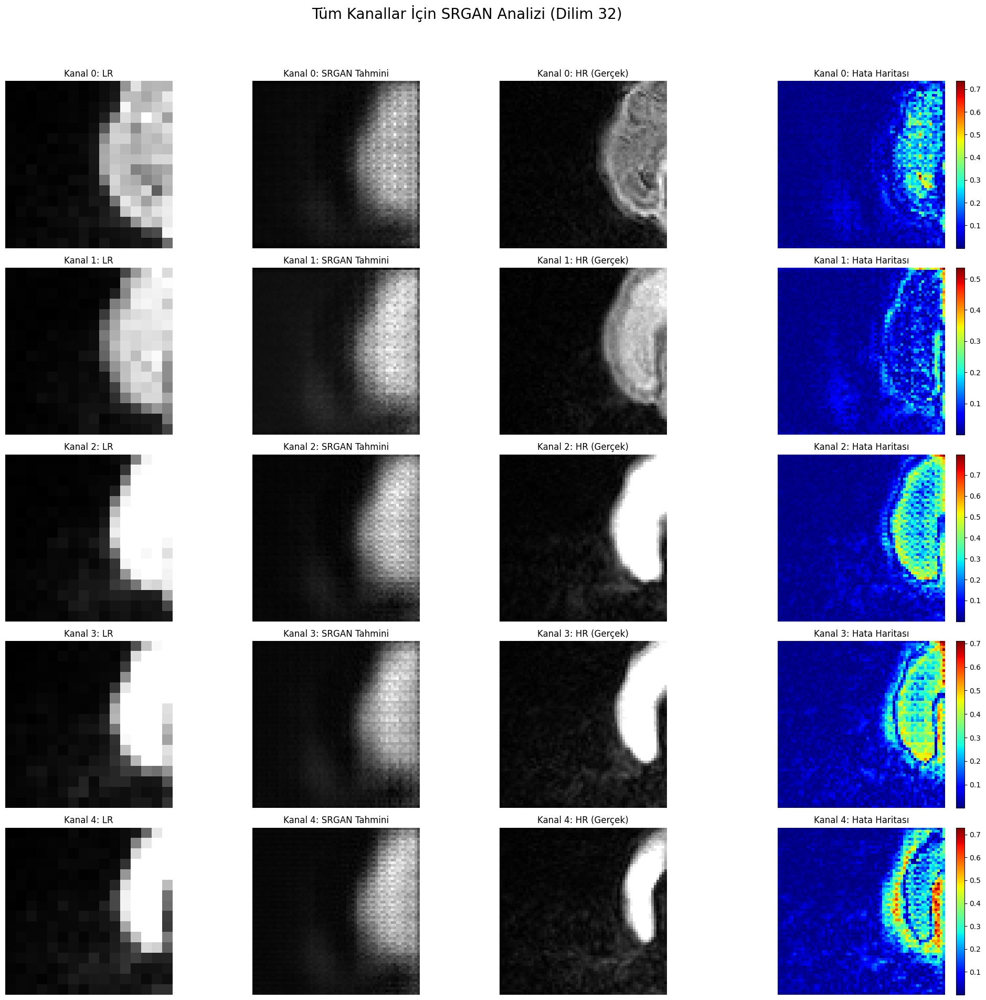

In [35]:
def visualize_all_channels_srgan(generator, dataloader, device, hr_key, lr_key):
    generator.eval()

    # Bir batch veri al
    batch = next(iter(dataloader))
    lr = batch[lr_key].to(device)  # (B, 5, h, w, d)
    hr = batch[hr_key].to(device)  # (B, 5, H, W, D)

    with torch.no_grad():
        sr = generator(lr)

    # Verileri CPU'ya al
    sr = sr.cpu().numpy()
    hr = hr.cpu().numpy()
    lr_cpu = lr.cpu().numpy()

    num_channels = hr.shape[1] # Dinamik olarak kanal sayısını al (5)
    mid_slice = hr.shape[-1] // 2
    lr_mid_slice = lr.shape[-1] // 2

    fig, axes = plt.subplots(num_channels, 4, figsize=(20, 4 * num_channels))
    fig.suptitle(f"Tüm Kanallar İçin SRGAN Analizi (Dilim {mid_slice})", fontsize=20)

    for c in range(num_channels):
        # LR Input
        axes[c, 0].imshow(lr_cpu[0, c, :, :, lr_mid_slice], cmap="gray")
        axes[c, 0].set_title(f"Kanal {c}: LR")
        axes[c, 0].axis("off")

        # SR Output
        axes[c, 1].imshow(sr[0, c, :, :, mid_slice], cmap="gray")
        axes[c, 1].set_title(f"Kanal {c}: SRGAN Tahmini")
        axes[c, 1].axis("off")

        # HR Ground Truth
        axes[c, 2].imshow(hr[0, c, :, :, mid_slice], cmap="gray")
        axes[c, 2].set_title(f"Kanal {c}: HR (Gerçek)")
        axes[c, 2].axis("off")

        # Error Map
        error = np.abs(hr[0, c, :, :, mid_slice] - sr[0, c, :, :, mid_slice])
        im = axes[c, 3].imshow(error, cmap="jet")
        axes[c, 3].set_title(f"Kanal {c}: Hata Haritası")
        axes[c, 3].axis("off")
        plt.colorbar(im, ax=axes[c, 3], fraction=0.046, pad=0.04)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Kullanımı:
visualize_all_channels_srgan(generator, train_loader, device, HR_KEY, LR_KEY)